# Filtragem de imagem tomografica usando transformada de Fourier em Python

Nesse notebook vamos demonstrar a aplicação de filtros passa-baixa e passa-alta em imagens tomográficas utilizando a transformada de Fourier. Além disso, vamos comparar os resultados obtidos com diferentes tipos de filtros (ideal e gaussiano) e uma modificação do filtro passa-alta que preserva as componentes dc.

## Instalando bibliotecas necessarias

In [1]:

# import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import SimpleITK as sitk
# from scipy.signal.windows import tukey
import scipy.ndimage as ndimage

## Dados de entrada

Como dados de entrada, utilizamos um volume tomografica do coração. O volume contem dimensão 47 x 512 x 512 voxels, cada um dos 47 cortes axiais representa uma imagem 2D de 512 x 512 pixels. 
Para processamento foi feito a normalização dos valores de intensidade dos pixels para o intervalo [0, 1]. Alem disso foi feito um padding de espelhamento na imagem ja que os dados originais aprensentavam uma borda brusca o que seria refletido no dominio da frequencia como artefatos de alta frequencia.

In [2]:
# lendo imagem tomografica
img_path = os.path.join('..', 'data', 'TRV2P4CTI.mhd')
sitk_image = sitk.ReadImage(img_path)
image_array = sitk.GetArrayFromImage(sitk_image)

In [3]:
print(f"---Informações do volume---")
print(f"Dimensões (Z, Y, X): {image_array.shape}")
print(f"Intensidade mínima: {image_array.min()}")
print(f"Intensidade máxima: {image_array.max()}")
print(f"Intensidade média: {image_array.mean():.2f}")

---Informações do volume---
Dimensões (Z, Y, X): (47, 512, 512)
Intensidade mínima: -2048
Intensidade máxima: 1882
Intensidade média: -722.03


In [4]:
# selectionando um corte axial para filtragem
slice_index = image_array.shape[0] // 2  # corte central
selected_slice = image_array[slice_index]
print(f"Selecionando o corte axial {slice_index} para filtragem.")
print(f"Corte selecionado shape: {selected_slice.shape}")
print(f"Intensidade mínima do corte: {selected_slice.min()}")
print(f"Intensidade máxima do corte: {selected_slice.max()}")
print(f"Intensidade média do corte: {selected_slice.mean():.2f}")

Selecionando o corte axial 23 para filtragem.
Corte selecionado shape: (512, 512)
Intensidade mínima do corte: -2048
Intensidade máxima do corte: 1450
Intensidade média do corte: -661.60


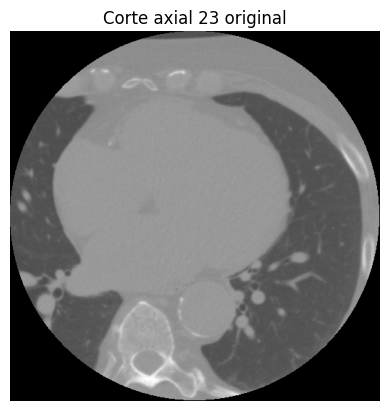

In [5]:
plt.imshow(selected_slice, cmap='gray')
plt.title(f'Corte axial {slice_index} original')
plt.axis('off')
plt.show()

In [6]:
# normalizando o corte selecionado para [0, 1]
min_val = np.min(selected_slice)
max_val = np.max(selected_slice)
slice_normalized = (selected_slice - min_val) / (max_val - min_val)
print(f"Maximo após normalização: {slice_normalized.max()}")
print(f"Minimo após normalização: {slice_normalized.min()}")
print(f"Média após normalização: {slice_normalized.mean():.2f}")

Maximo após normalização: 1.0
Minimo após normalização: 0.0
Média após normalização: 0.40


In [7]:
def fill_borders(image: np.ndarray) -> np.ndarray:
    """
    Substitui o fundo preto (0) estendendo os pixels da borda do círculo
    até preencher o quadrado usando a vizinhanca mais próxima.
    """

    if len(image.shape) != 2:
        raise ValueError("A imagem deve ser 2D.")
    if image.shape[0] != image.shape[1]:
        raise ValueError("A imagem deve ser quadrada.")

    mask_validos = image > 0
    
    distancia, indices = ndimage.distance_transform_edt(~mask_validos, return_indices=True, return_distances=True)
    imagem_preenchida = image[tuple(indices)]
    
    return imagem_preenchida

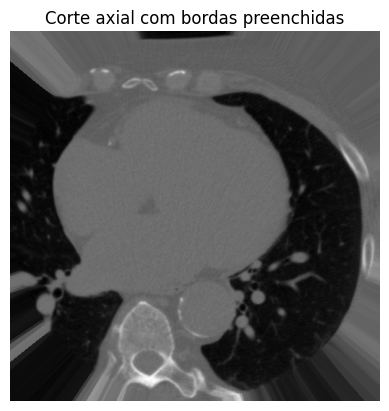

In [8]:
filled_imaged = fill_borders(slice_normalized)
plt.imshow(filled_imaged, cmap='gray')
plt.title('Corte axial com bordas preenchidas')
plt.axis('off')
plt.show()

## Filtragem

Para a filtragem será feito o processo de padding com 0 para evitar interferência das bordas na transformada de Fourier. Será feito a filtragem aplicando os filtros ideal e gaussiano, tanto passa-baixa quanto passa-alta e os resultados serão exibidos.

In [9]:
# valores de frequência de corte para os filtros
cutoffs = [5, 10, 20, 30, 40, 50, 100]

In [10]:
def add_padding(img: np.ndarray, pad_height: int, pad_width: int) -> np.ndarray:
    """
    Adiciona padding de zeros do lado esquerdo e embaixo da imagem.
    """
    img_padded = np.pad(array=img, 
                        pad_width=((0, pad_height), (0, pad_width)), 
                        mode='constant', 
                        constant_values=0)
    return img_padded

In [11]:
def remove_padding(img_padded: np.ndarray, original_height: int, original_width: int) -> np.ndarray:
    """
    Remove o padding de zeros do lado esquerdo e embaixo da imagem.
    """
    img_cropped = img_padded[0:original_height, 0:original_width]
    return img_cropped

In [12]:
def plot_image_comparison(plots: dict, title: str = "Comparação de Imagens"):
    """
    Plota uma comparação lado a lado de várias imagens.
    
    Parâmetros:
    - plots: dicionário onde as chaves são os títulos das imagens e os valores são as imagens (arrays 2D).
    - title: título geral do gráfico.
    """
    num_plots = len(plots)
    plt.figure(figsize=(5 * num_plots, 5))
    
    for i, (plot_title, img) in enumerate(plots.items()):
        plt.subplot(1, num_plots, i + 1)
        plt.imshow(img, cmap='gray')
        plt.title(plot_title)
        plt.axis('off')
    
    plt.suptitle(title)
    plt.show()

In [13]:
def filter_image(image: np.ndarray, cutoff: float, func_filter: callable) -> np.ndarray:
    """
    Filtra a imagem usando a função de filtro fornecida.
    
    Parâmetros:
    - image: imagem 2D a ser filtrada.
    - cutoff: frequência de corte para o filtro.
    - func_filter: função que cria o filtro no domínio da frequência.
    
    Retorna:
    -
    """
    
    original_height, original_width = image.shape
    pad_height = original_height
    pad_width = original_width
    
    # Adiciona padding
    image_padded = add_padding(image, pad_height, pad_width)
    
    # Transformada de Fourier e centralização
    F = np.fft.fft2(image_padded)
    F_shifted = np.fft.fftshift(F)
    
    # Cria e aplica o filtro
    filter_mask = func_filter(image_padded.shape, cutoff)
    F_filtered = F_shifted * filter_mask
    
    # Transformada inversa de Fourier
    F_ishifted = np.fft.ifftshift(F_filtered)
    image_filtered_padded = np.fft.ifft2(F_ishifted)
    image_filtered_padded = np.abs(image_filtered_padded) # Magnitude
    
    # Remove o padding
    image_filtered = remove_padding(image_filtered_padded, original_height, original_width)
    
    return {
        "Imagem original": image,
        "Filtro": filter_mask,
        "Espectro": np.log1p(np.abs(F_shifted)),
        "Imagem filtrada": image_filtered
    }

### Filtragem passa-baixa

In [14]:
def low_pass_ideal(shape: tuple, cutoff: float) -> np.ndarray:
    """
    Cria um filtro passa-baixa ideal.
    
    Parâmetros:
    - shape: tupla com as dimensões do filtro (altura, largura).
    - cutoff: frequência de corte.
    
    Retorna:
    - filtro passa-baixa ideal.
    """
    U, V = shape
    H = np.zeros((U, V), dtype=np.float32)
    center = U // 2, V // 2
    
    # calcula distancia euclidiana coloca 1 dentro do limite
    for u in range(U):
        for v in range(V):
            D = np.sqrt((u - center[0]) ** 2 + (v - center[1]) ** 2)
            if D <= cutoff:
                H[u, v] = 1.0
    return H

In [15]:
def low_pass_gaussian(shape: tuple, cutoff: float) -> np.ndarray:
    """
    Cria um filtro passa-baixa gaussiano.
    
    Parâmetros:
    - shape: tupla com as dimensões do filtro (altura, largura).
    - cutoff: frequência de corte.
    
    Retorna:
    - filtro passa-baixa gaussiano.
    """
    U, V = shape
    H = np.zeros((U, V), dtype=np.float32)
    center = U // 2, V // 2
    
    # calcula distancia euclidiana e aplica a formula do gaussiano
    for u in range(U):
        for v in range(V):
            D = np.sqrt((u - center[0]) ** 2 + (v - center[1]) ** 2)
            H[u, v] = np.exp(-(D ** 2) / (2 * (cutoff ** 2)))
    return H

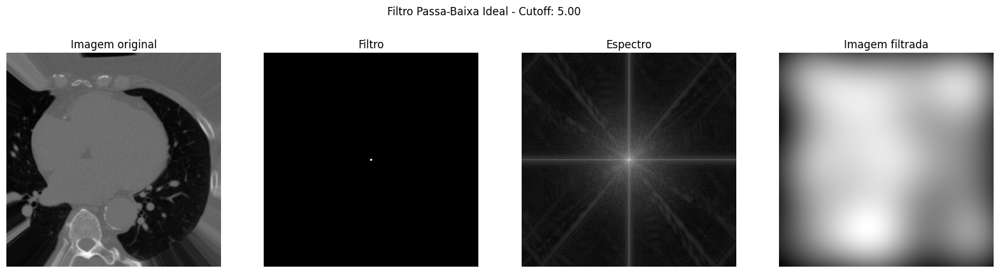

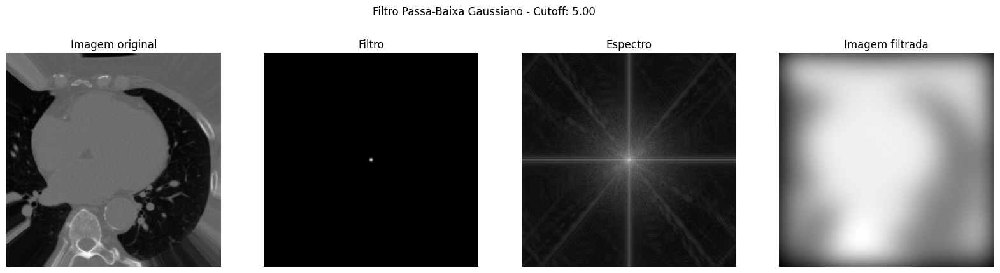

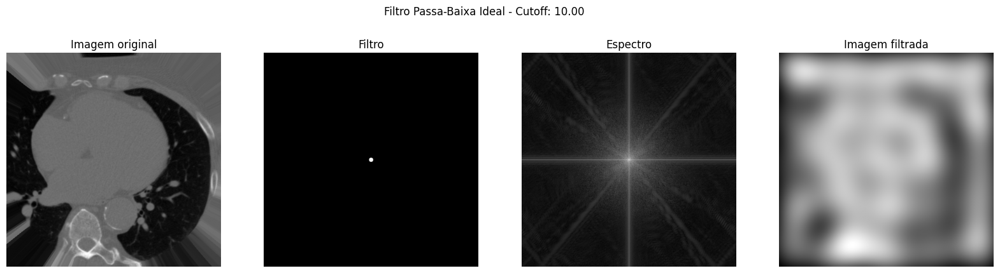

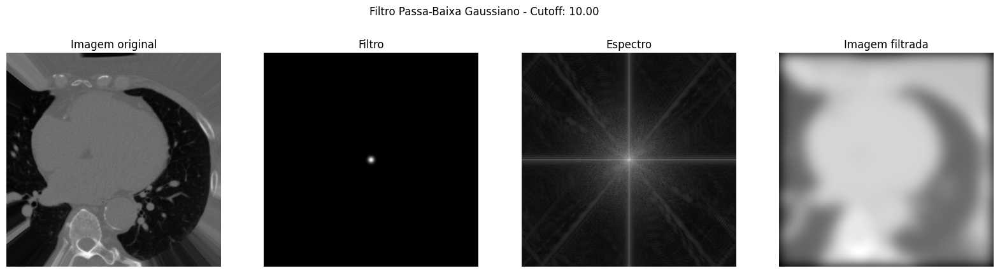

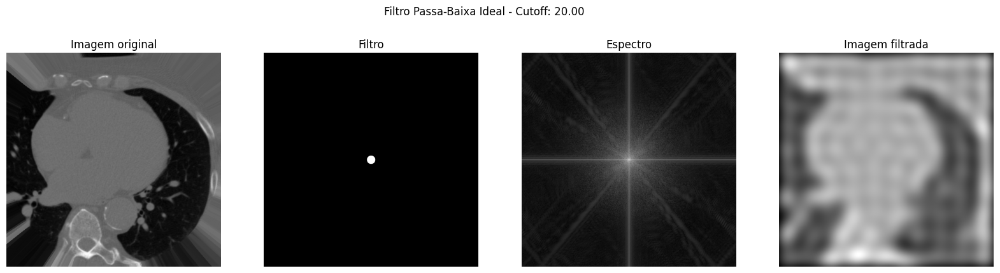

...

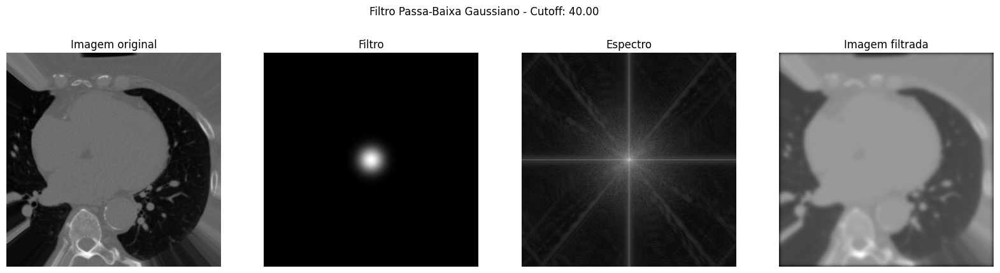

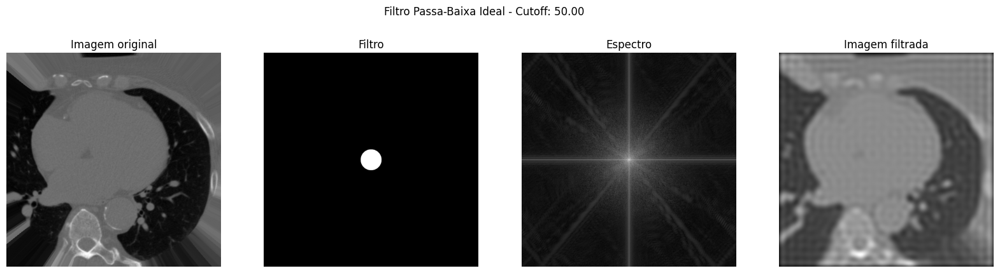

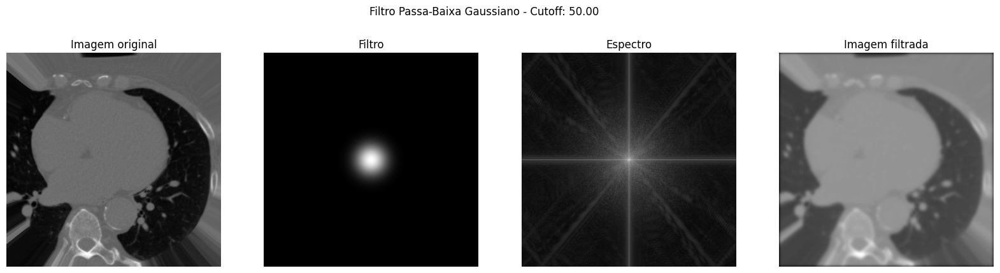

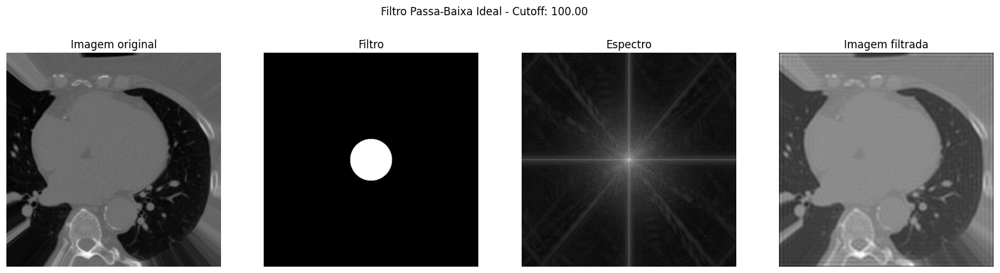

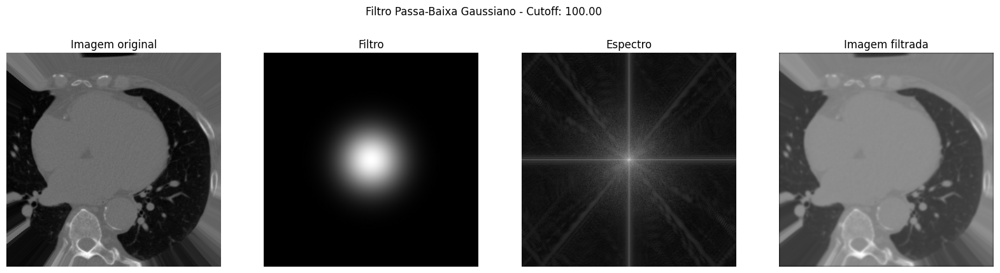

In [16]:
for cutoff in cutoffs:
    results_ideal = filter_image(filled_imaged, cutoff, low_pass_ideal)
    results_gaussian = filter_image(filled_imaged, cutoff, low_pass_gaussian)
    
    plot_image_comparison(results_ideal, title=f'Filtro Passa-Baixa Ideal - Cutoff: {cutoff:.2f}')
    plot_image_comparison(results_gaussian, title=f'Filtro Passa-Baixa Gaussiano - Cutoff: {cutoff:.2f}')

### Filtragem passa-alta

In [17]:
def high_pass_ideal(shape: tuple, cutoff: float) -> np.ndarray:
    """
    Cria um filtro passa-alta ideal.
    
    Parâmetros:
    - shape: tupla com as dimensões do filtro (altura, largura).
    - cutoff: frequência de corte.
    
    Retorna:
    - filtro passa-alta ideal.
    """
    U, V = shape
    H = np.ones((U, V), dtype=np.float32)
    center = U // 2, V // 2
    
    # calcula distancia euclidiana coloca 0 dentro do limite
    for u in range(U):
        for v in range(V):
            D = np.sqrt((u - center[0]) ** 2 + (v - center[1]) ** 2)
            if D <= cutoff:
                H[u, v] = 0.0
    return H

In [18]:
def high_pass_gaussian(shape: tuple, cutoff: float) -> np.ndarray:
    """
    Cria um filtro passa-alta gaussiano.
    
    Parâmetros:
    - shape: tupla com as dimensões do filtro (altura, largura).
    - cutoff: frequência de corte.
    
    Retorna:
    - filtro passa-alta gaussiano.
    """
    U, V = shape
    H = np.zeros((U, V), dtype=np.float32)
    center = U // 2, V // 2
    
    # calcula distancia euclidiana e aplica a formula do gaussiano
    for u in range(U):
        for v in range(V):
            D = np.sqrt((u - center[0]) ** 2 + (v - center[1]) ** 2)
            H[u, v] = 1 - np.exp(-(D ** 2) / (2 * (cutoff ** 2)))
    return H

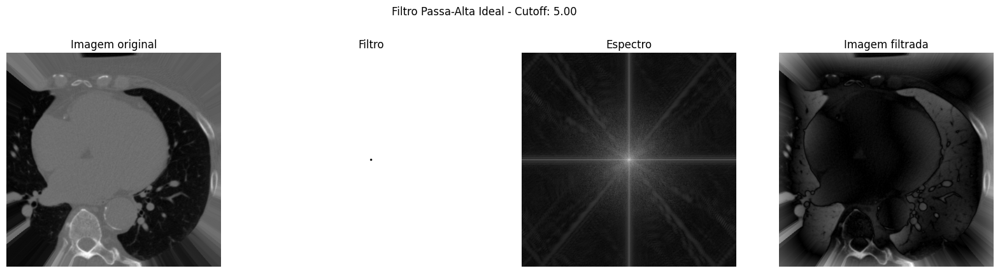

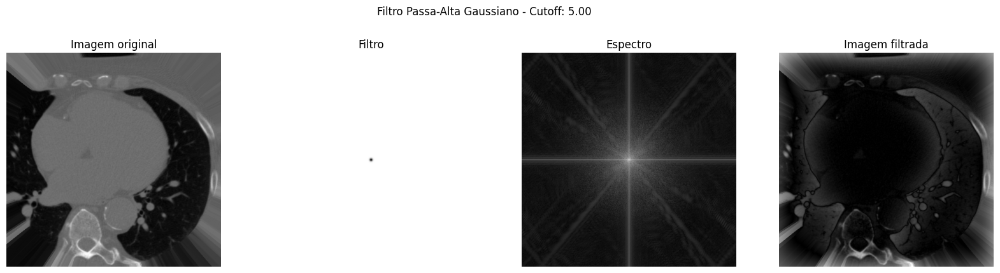

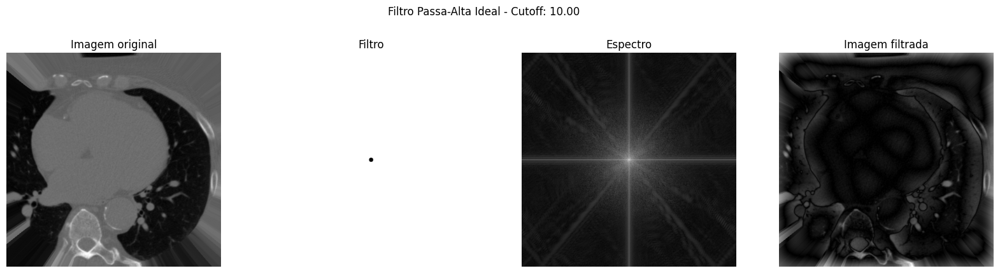

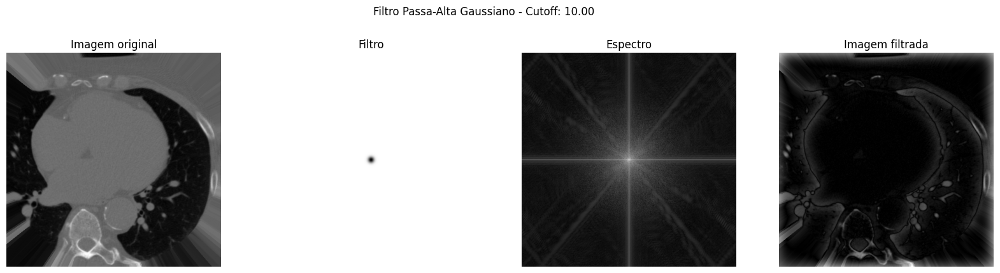

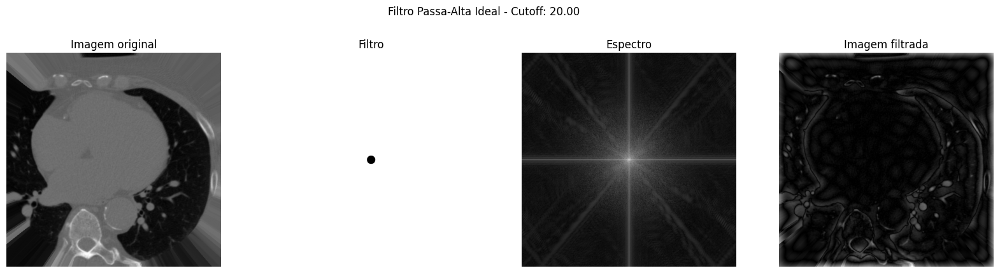

...

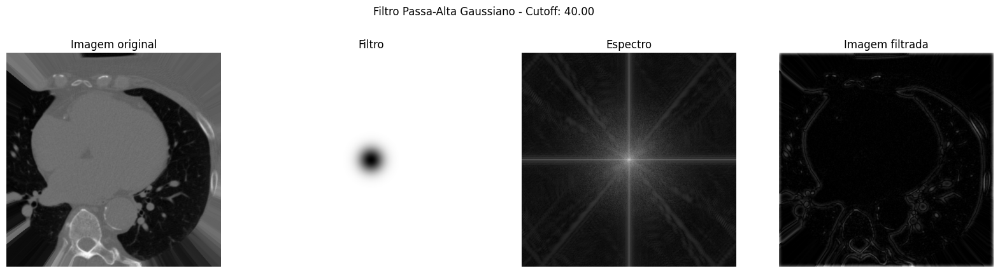

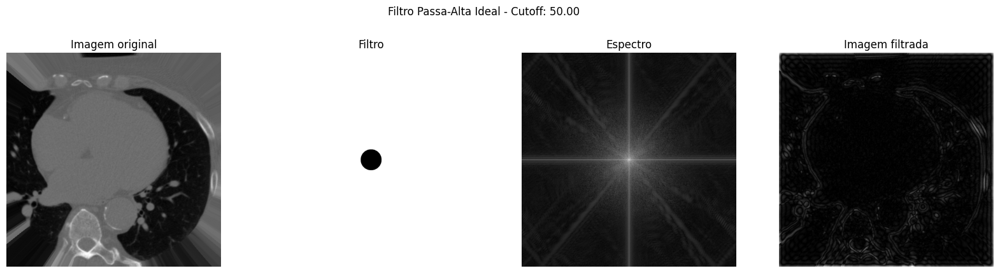

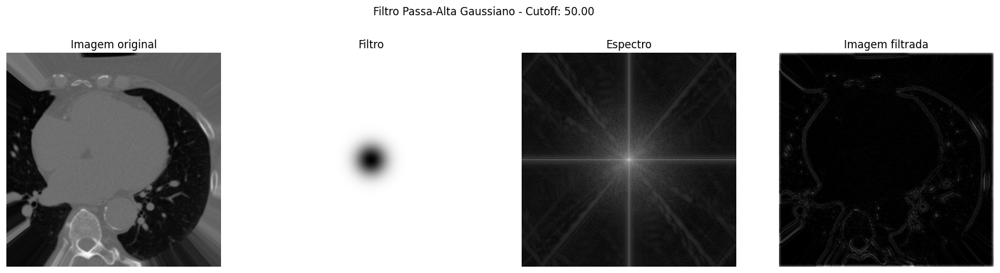

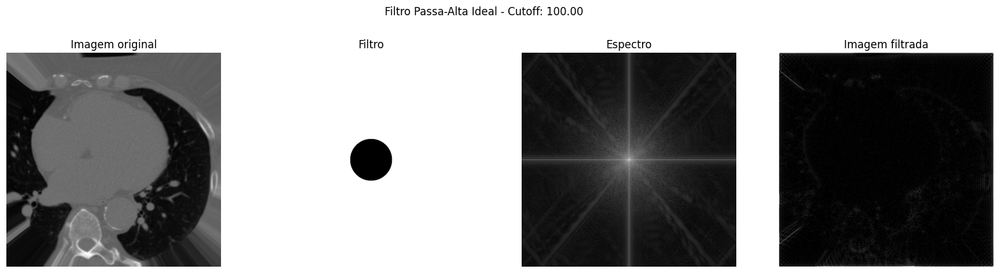

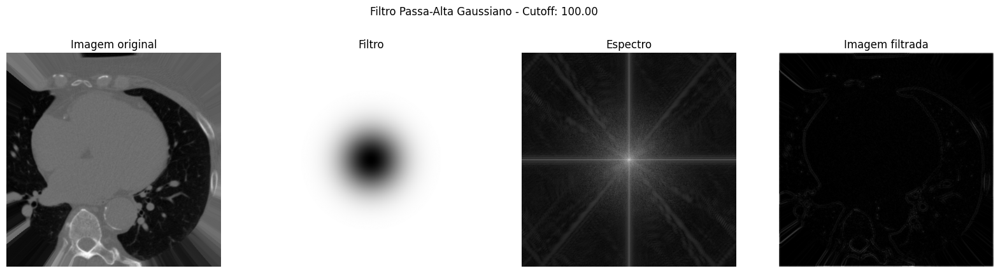

In [19]:
for cutoff in cutoffs:
    results_ideal = filter_image(filled_imaged, cutoff, high_pass_ideal)
    results_gaussian = filter_image(filled_imaged, cutoff, high_pass_gaussian)
    
    plot_image_comparison(results_ideal, title=f'Filtro Passa-Alta Ideal - Cutoff: {cutoff:.2f}')
    plot_image_comparison(results_gaussian, title=f'Filtro Passa-Alta Gaussiano - Cutoff: {cutoff:.2f}')
    

### Filtragem passa-alta com preservação da componente DC

In [20]:
def mod_high_pass_gaussian(shape: tuple, cutoff: float, offset=0.5, multiplier=1.0) -> np.ndarray:
    """
    Cria um filtro passa-alta gaussiano modificado.
    Segue a fórmula: H(u,v) = a + b(1 - e^(-(D(u,v)^2) / (2*D0^2)))
    
    Parâmetros:
    - shape: tupla com as dimensões do filtro (altura, largura).
    - cutoff: frequência de corte.
    - offset: valor a ser adicionado ao filtro para não perder intensidade.
    - multiplier: valor pelo qual o filtro é multiplicado para aumentar bordas.
    
    Retorna:
    - filtro passa-alta gaussiano modificado.
    """
    U, V = shape
    H = np.ones((U, V), dtype=np.float32)
    center = U // 2, V // 2
    
    # calcula distancia euclidiana e aplica a formula do gaussiano modificado
    for u in range(U):
        for v in range(V):
            D = np.sqrt((u - center[0]) ** 2 + (v - center[1]) ** 2)
            h = 1 - np.exp(-(D ** 2) / (2 * (cutoff ** 2)))
            H[u, v] = offset + multiplier * h
    return H

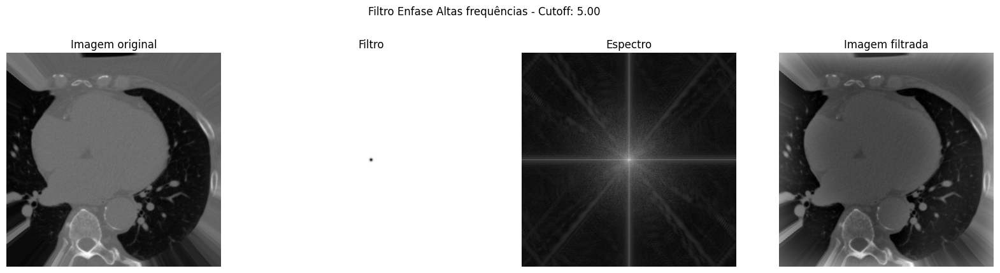

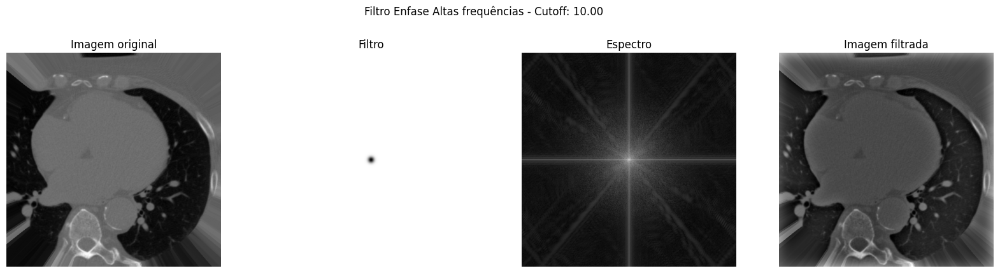

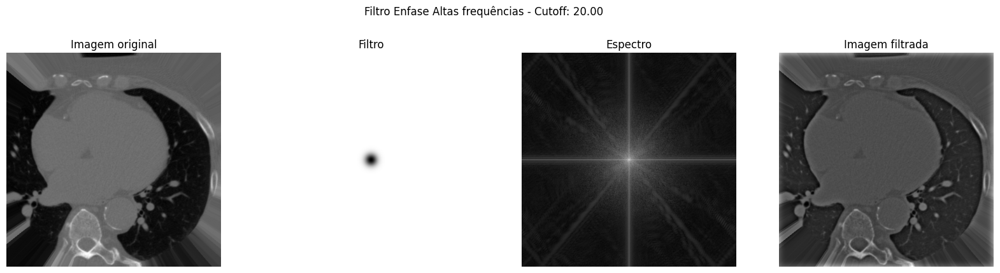

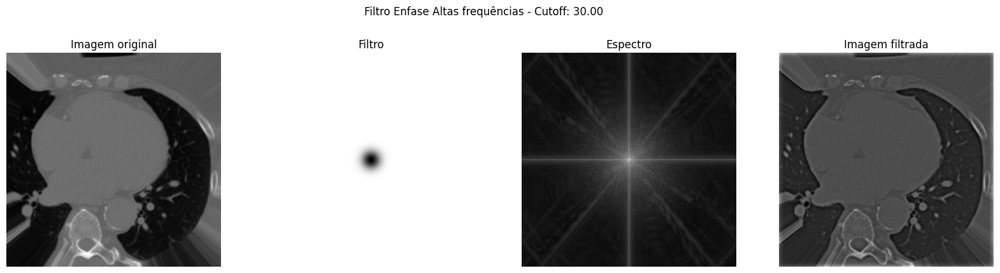

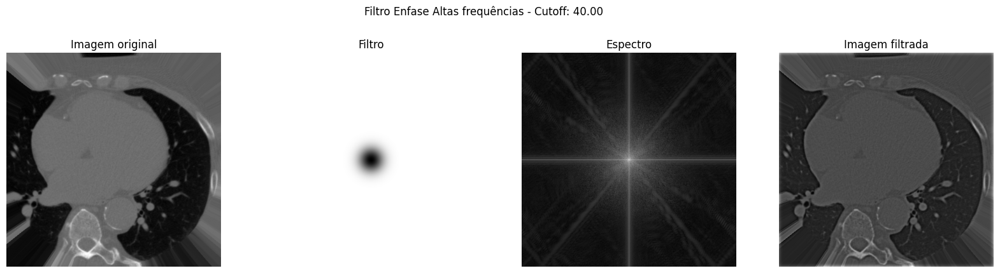

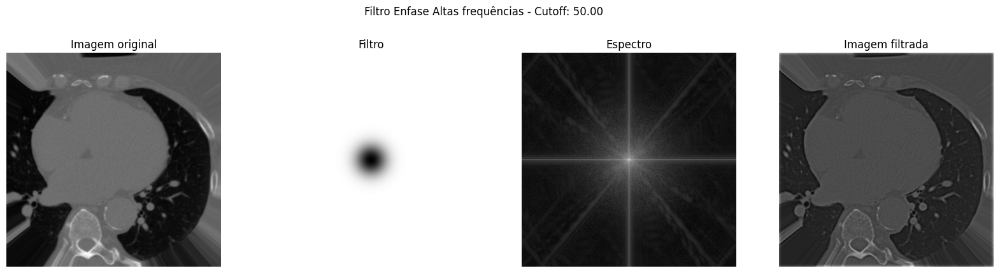

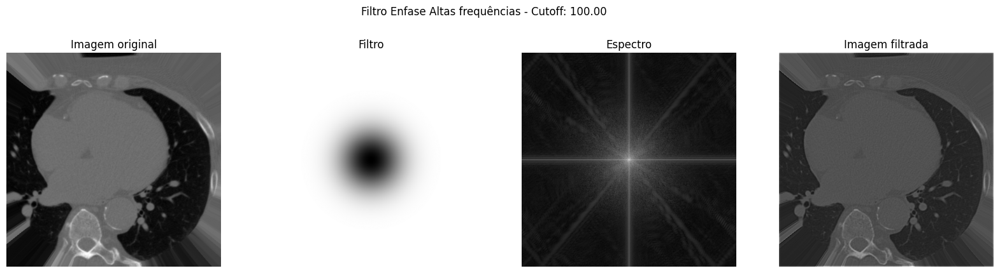

In [21]:
for cutoff in cutoffs:
    results_gaussian = filter_image(filled_imaged, cutoff, mod_high_pass_gaussian)
    plot_image_comparison(results_gaussian, title=f'Filtro Enfase Altas frequências - Cutoff: {cutoff:.2f}')